In [9]:
from furniture_bench.robot.robot_state import filter_and_concat_robot_state

import zarr
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
import pickle

import cv2

## Have a look at the data

In [2]:
paths = list(Path("/data/scratch/ankile/furniture-data/data/raw/sim/image_small").rglob("*.pkl"))

paths[:3]

[PosixPath('/data/scratch/ankile/furniture-data/data/raw/sim/image_small/one_leg/low/2023-10-25-18:31:18/2023-10-25-18:31:18.pkl'),
 PosixPath('/data/scratch/ankile/furniture-data/data/raw/sim/image_small/one_leg/low/2023-10-25-18:34:05/2023-10-25-18:34:05.pkl'),
 PosixPath('/data/scratch/ankile/furniture-data/data/raw/sim/image_small/one_leg/low/2023-10-26-12:01:41/2023-10-26-12:01:41.pkl')]

In [3]:
path = paths[0]

with open(path, "rb") as f:
    data = pickle.load(f)

data.keys()

dict_keys(['observations', 'actions', 'rewards', 'skills', 'success', 'furniture', 'error', 'error_description'])

In [4]:
skill_names = [
    "Pick tabletop",
    "Place tabletop",
    "Pick leg",
    "Insert leg",
    "Screw leg",
]

In [5]:
skills = np.array(data["skills"])

skills_index = skills.cumsum()

skills_index[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1])

In [6]:
# Annotate the video with the current skill being played out

annotated_video = []

for obs, skill_idx in tqdm(zip(data["observations"], skills_index)):
    img1 = obs["color_image1"]
    img2 = obs["color_image2"]

    img = np.concatenate([img1, img2], axis=1)

    # Add text to the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    org = (10, 30)
    fontScale = 1
    color = (255, 0, 0)
    thickness = 2
    img = cv2.putText(img, skill_names[skill_idx], org, font, fontScale, color, thickness, cv2.LINE_AA)

    annotated_video.append(img)

475it [00:00, 4228.02it/s]


MoviePy - Building file annotated_video.gif with imageio.


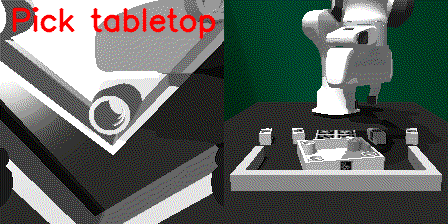

In [7]:
# Display the annotated video as a gif
from IPython.display import Image, display
import moviepy.editor as mpy


def display_gif(fn):
    return display(Image(data=fn, format="png"))


def make_gif(images, fname, fps=10):
    clip = mpy.ImageSequenceClip(images, fps=fps)
    clip.write_gif(fname, fps=fps)


make_gif(annotated_video, "annotated_video.gif", fps=10)

display_gif("annotated_video.gif")

## Start splitting it up into episodes for each skill

In [22]:
file_paths = paths[:1]

print(f"Number of trajectories: {len(file_paths)}")

(
    robot_state,
    color_image1,
    color_image2,
    actions,
    rewards,
    skills,
    episode_ends,
    furniture,
) = (
    [],
    [],
    [],
    [],
    [],
    [],
    [],
    [],
)
end_index = 0

for path in tqdm(file_paths):
    with open(path, "rb") as f:
        data = pickle.load(f)

    furniture.append(data["furniture"])
    skill_idxs = np.array(data["skills"]).cumsum()
    curr_skill = 0

    for i, (obs, action, reward, skill_idx) in enumerate(
        zip(data["observations"], data["actions"], data["rewards"], skill_idxs)
    ):
        end_index += 1

        # Add one more element to the action to model a "done" action
        action = np.concatenate([action, [0]])

        if curr_skill != skill_idx or i == len(data["actions"]) - 1:
            curr_skill = skill_idx
            episode_ends.append(end_index)

            # If we are at the end of the current skill, set the "done" action to 1 and add reward of 1
            action[-1] = 1
            reward = 1

        robot_state.append(filter_and_concat_robot_state(obs["robot_state"]))
        color_image1.append(obs["color_image1"])
        color_image2.append(obs["color_image2"])
        actions.append(action)
        rewards.append(reward)
        skills.append(skill_idx)

# Convert to numpy arrays
robot_state = np.array(robot_state, dtype=np.float32)
color_image1 = np.array(color_image1, dtype=np.uint8)
color_image2 = np.array(color_image2, dtype=np.uint8)
actions = np.array(actions, dtype=np.float32)
rewards = np.array(rewards, dtype=np.float32)
skills = np.array(skills, dtype=np.float32)

save_data = dict(
    robot_state=np.array(robot_state, dtype=np.float32),
    color_image1=color_image1,
    color_image2=np.array(color_image2, dtype=np.uint8),
    action=np.array(actions, dtype=np.float32),
    reward=np.array(rewards, dtype=np.float32),
    skills=np.array(skills, dtype=np.float32),
    episode_ends=np.array(episode_ends, dtype=np.uint32),
    furniture=furniture,
    time_created=np.datetime64("now"),
)

Number of trajectories: 1


100%|██████████| 1/1 [00:00<00:00, 19.97it/s]


In [28]:
save_data["skills"]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3.,
       3., 3., 3., 3., 3.